In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from deepsvg.svglib.svg import SVG

from deepsvg import utils
from deepsvg.difflib.tensor import SVGTensor
from deepsvg.svglib.utils import to_gif
from deepsvg.svglib.geom import Bbox
from deepsvg.svg_dataset import SVGDataset, load_dataset
from deepsvg.utils.utils import batchify, linear

import torch

import os
import ntpath
import re
from tqdm import tqdm
import pickle
import random

import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

from cairosvg import svg2png
from PIL import Image
import cv2

import pandas as pd
import numpy as np

from sklearn.manifold import TSNE

In [3]:
from configs.deepsvg.fake_labelled import Config
cfg = Config()

# extract dataframe
dataset = load_dataset(cfg)
df = dataset.df

# define dataset folder
dataset_folder = os.path.dirname(cfg.meta_filepath)

# Images Array
jpg_img_array = np.zeros((len(df), 64, 64, 3))
png_img_array = np.zeros((len(df), 64, 64, 4))

# pickle_path
pickle_path = 'encoded_data'

In [4]:
colors = ['#e6194B', '#3cb44b', '#ffe119', '#4363d8',
          '#f58231', '#42d4f4', '#f032e6', '#fabed4',
          '#469990', '#dcbeff', '#9A6324', '#fffac8',
          '#800000', '#aaffc3', '#000075', '#a9a9a9']

In [5]:
pickle_files = ['encoded_data/fake_unlabelled_64.pkl',
                'encoded_data/fake_unlabelled_128.pkl',
                'encoded_data/fake_unlabelled_256.pkl',
                'encoded_data/fake_unlabelled_512.pkl',
                'encoded_data/fake_labelled_64.pkl',
                'encoded_data/fake_labelled_128.pkl',
                'encoded_data/fake_labelled_256.pkl',
                'encoded_data/fake_labelled_512.pkl']

In [6]:
# create image arrays

with open(pickle_files[0], 'rb') as handle:
    file = pickle.load(handle)

jpg_paths = file['jpg_paths']
png_paths = file['png_paths']

for i in tqdm(range(len(jpg_paths))):
    jpg = Image.open(jpg_paths[i])    
    jpg_img_array[i, :, : ,:] = np.array(jpg)
    
    png = Image.open(png_paths[i])    
    png_img_array[i, :, : ,:] = np.array(png)
    
jpg_img_array = jpg_img_array.astype(int)
png_img_array = png_img_array.astype(int)

100%|██████████| 20299/20299 [00:05<00:00, 3413.10it/s]


In [64]:
num_fonts = 5
images_per_font = 50

case = 'fonts'

if case == 'fonts':
    images_per_font = min(images_per_font, 50)
    fonts = np.array([a.split('_')[1] for a in df['id'].values])
elif case == 'characters':
    fonts = np.array([a.split('_')[4] for a in df['id'].values])
elif case == 'serifs':
    num_fonts = min(2, num_fonts)
    fonts = np.array([a for a in df['type'].values])


unique_fonts = np.array(list(set(fonts)))

img_nums = np.zeros(num_fonts*images_per_font).astype(int)
img_colors = []
labels = []

sample_fonts = np.random.choice(unique_fonts, num_fonts, replace=False)
for i, font in enumerate(sample_fonts):
    if i==0 or case == 'characters':
        indices = np.where(fonts==font)[0]
        sample_indices = np.random.choice(indices, images_per_font, replace=False).astype(int)
    else:
        indices = np.where(fonts==font)[0]
        chars = df.iloc[sample_indices]['character'].values
        sample_indices = [df.iloc[indices].loc[df.iloc[indices]['character'] == ch].index[0] for ch in chars]

    img_nums[(i)*images_per_font:(i+1)*images_per_font] = sample_indices
    img_colors += [colors[i]]
    labels += [font]*images_per_font

images = png_img_array[img_nums,:,:,:]

In [65]:
def visualize_scatter_with_images(tsne_vec, images, save_path, figsize=(100,50), image_zoom=3):
    fig, ax = plt.subplots(figsize=figsize)
    for c, (xy, i) in enumerate(zip(tsne_vec, images)):
        x0, y0 = xy
        if c == 0:
            print("Size of one image: ", i.shape)
        if i.shape[0] == 1:
            img = OffsetImage(i,zoom=image_zoom, cmap="gray")
        else:
             img = OffsetImage(i,zoom=image_zoom)
        ab = AnnotationBbox(img, (x0, y0), xycoords='data', frameon=False)
        ax.add_artist(ab)
    ax.set_axis_off()
    ax.update_datalim(tsne_vec)
    ax.autoscale()
    fig.savefig(save_path)

def visualize_scatter_with_points(tsne_vec, labels, colors, save_path, figsize=(8,4)):
    plt.figure(figsize=figsize, facecolor='white')
    plt.title(ntpath.basename(save_path).split('.')[0])
    
    unique = list(set(labels))
    for i, u in enumerate(unique):
        xi = [tsne_vec[j,0] for j  in range(tsne_vec.shape[0]) if labels[j] == u]
        yi = [tsne_vec[j,1] for j  in range(tsne_vec.shape[0]) if labels[j] == u]
        plt.scatter(xi, yi, c=colors[i], label=str(u))
    plt.legend()
    plt.savefig(save_path)


Size of one image:  (64, 64, 4)
Size of one image:  (64, 64, 4)
Size of one image:  (64, 64, 4)
Size of one image:  (64, 64, 4)
Size of one image:  (64, 64, 4)
Size of one image:  (64, 64, 4)
Size of one image:  (64, 64, 4)
Size of one image:  (64, 64, 4)


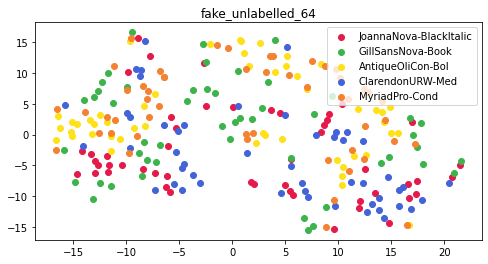

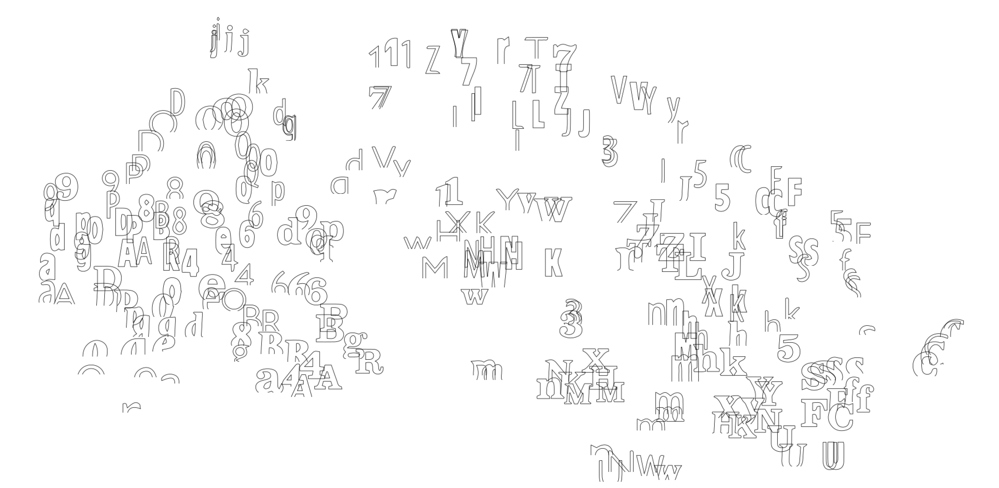

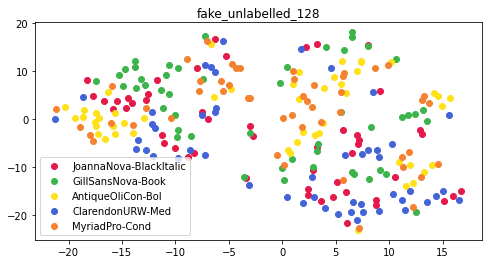

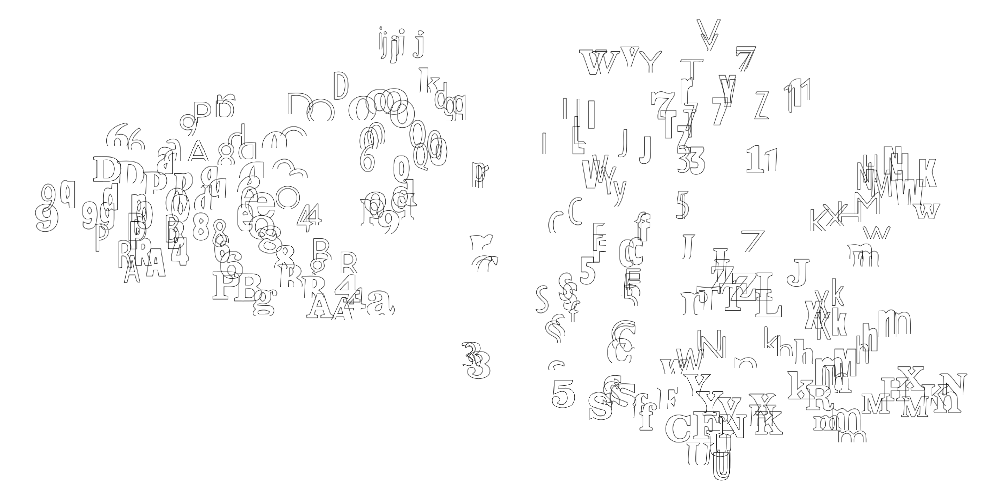

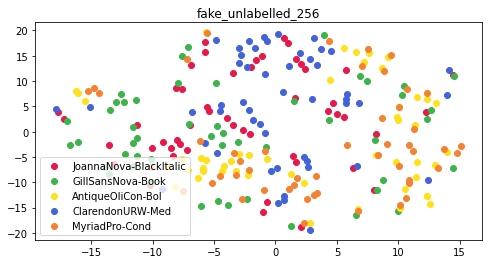

...

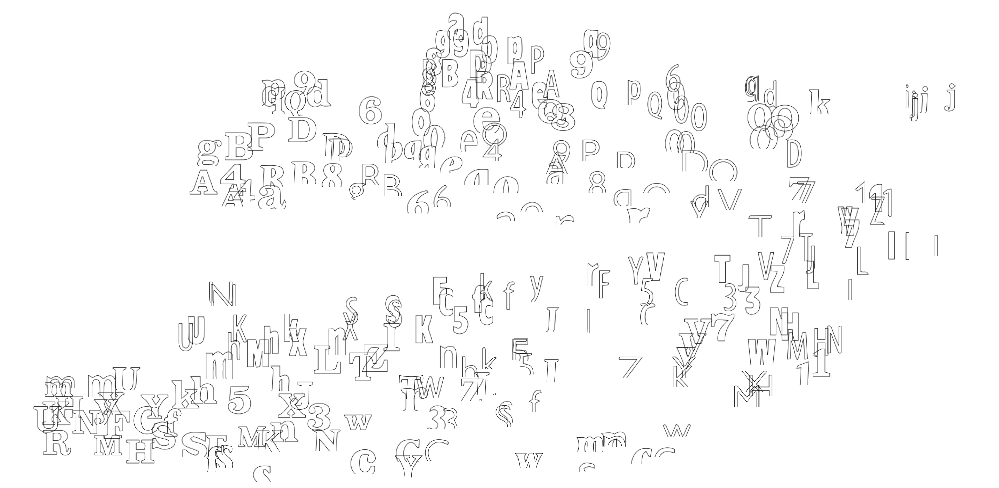

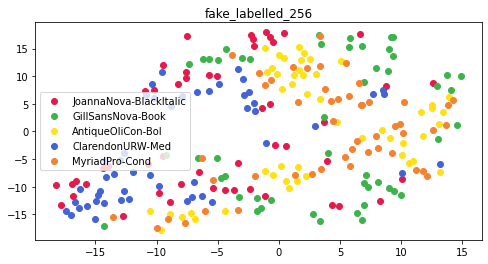

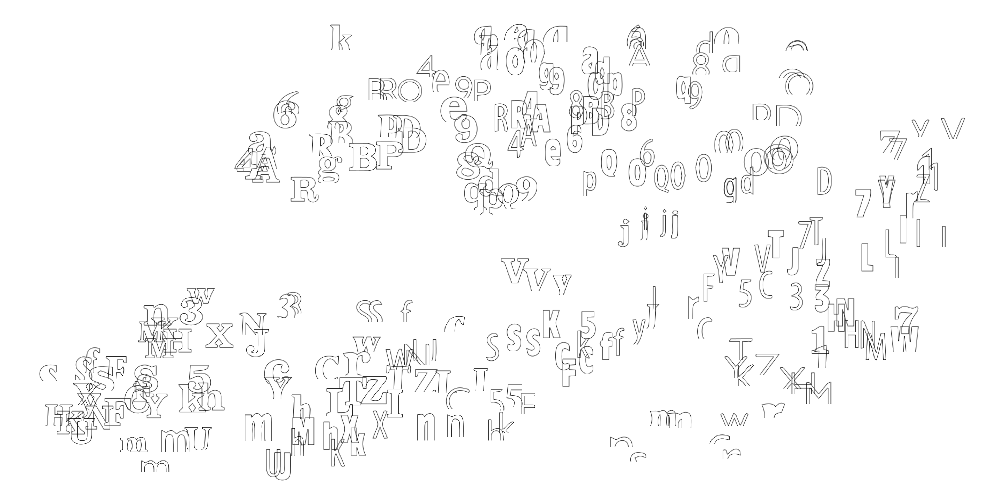

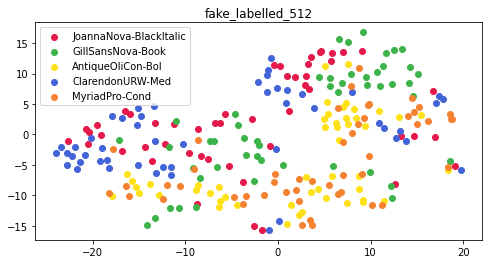

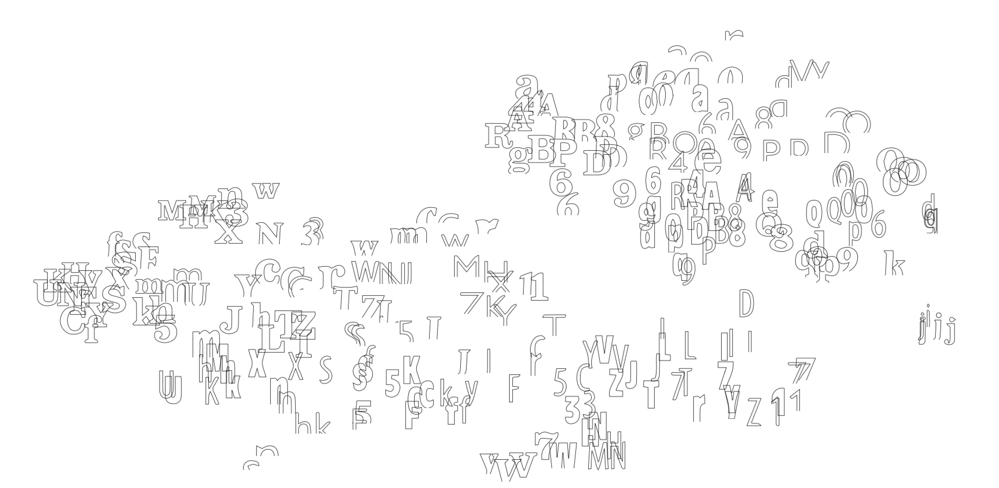

In [66]:
for path in pickle_files:
    with open(path, 'rb') as handle:
        data = pickle.load(handle)
    tensors = data['tensors']
    
    features = tensors[img_nums]
    tsne = TSNE(n_jobs= -1)
    reduced = tsne.fit_transform(features)
    
    fig_path_points = os.path.join('encoded_TSNE', 'points', ntpath.basename(path).split('.')[0] + '.jpg')
    fig_path_images = os.path.join('encoded_TSNE', 'images', ntpath.basename(path).split('.')[0] + '.jpg')
    
    
    visualize_scatter_with_points(reduced, labels, img_colors, fig_path_points)
    visualize_scatter_with_images(reduced, images, fig_path_images)